In [1]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
ticker = 'KO' # Coca-Cola stock ticker
data = yf.download(ticker, start='2015-01-01',
end='2023-12-31')

C:\Users\utkar\AppData\Local\Temp\ipykernel_20976\214095949.py:2: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start='2015-01-01',
[*********************100%***********************]  1 of 1 completed


In [3]:
data.head()

Price,Close,High,Low,Open,Volume
Ticker,KO,KO,KO,KO,KO
Date,,,,,
2015-01-02,29.992609,30.177662,29.750618,30.078017,9921100
2015-01-05,29.992609,30.583352,29.949907,30.384064,26292600
2015-01-06,30.220358,30.561991,30.063778,30.184772,16897500
2015-01-07,30.597569,30.682976,30.305757,30.462337,13412300
2015-01-08,30.967686,31.010391,30.675874,30.732814,21743600


In [4]:
data.reset_index(inplace=True)

In [5]:
print(data.info())
print(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2264 entries, 0 to 2263
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   (Date, )      2264 non-null   datetime64[ns]
 1   (Close, KO)   2264 non-null   float64       
 2   (High, KO)    2264 non-null   float64       
 3   (Low, KO)     2264 non-null   float64       
 4   (Open, KO)    2264 non-null   float64       
 5   (Volume, KO)  2264 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 106.3 KB
None
Price        Date      Close       High        Low       Open    Volume
Ticker                    KO         KO         KO         KO        KO
0      2015-01-02  29.992609  30.177662  29.750618  30.078017   9921100
1      2015-01-05  29.992609  30.583352  29.949907  30.384064  26292600
2      2015-01-06  30.220358  30.561991  30.063778  30.184772  16897500
3      2015-01-07  30.597569  30.682976  30.305757  30.462

In [6]:
print(data.isnull().sum())

Price   Ticker
Date              0
Close   KO        0
High    KO        0
Low     KO        0
Open    KO        0
Volume  KO        0
dtype: int64


In [7]:
data['MA_20'] = data['Close'].rolling(window=20).mean()
data['MA_50'] = data['Close'].rolling(window=50).mean()

In [8]:
data['Daily_Return'] = data['Close'].pct_change()

In [9]:
data['Volatility'] =data['Daily_Return'].rolling(window=20).std()
data.dropna(inplace=True)

print(data.head())

Price        Date      Close       High        Low       Open    Volume  \
Ticker                    KO         KO         KO         KO        KO   
49     2015-03-16  28.913841  28.956898  28.698549  28.705724  15238800   
50     2015-03-17  29.071699  29.229581  28.935348  29.186522  21661800   
51     2015-03-18  29.136293  29.272647  28.562180  29.050177  26247500   
52     2015-03-19  28.720070  29.078891  28.677010  29.050185  16057600   
53     2015-03-20  29.172180  29.179355  28.712886  28.755946  31608500   

Price       MA_20      MA_50 Daily_Return Volatility  
Ticker                                                
49      29.748196  29.998752     0.009521   0.011377  
50      29.713894  29.980334     0.005460   0.011464  
51      29.685669  29.963208     0.002222   0.011486  
52      29.623110  29.933202    -0.014285   0.011604  
53      29.588138  29.904694     0.015742   0.012260  


In [10]:
print(data.describe())


Price                            Date        Close         High          Low  \
Ticker                                          KO           KO           KO   
count                            2215  2215.000000  2215.000000  2215.000000   
mean    2019-08-06 07:49:22.889390592    42.048377    42.337400    41.754463   
min               2015-03-16 00:00:00    27.488176    27.872295    26.453467   
25%               2017-05-24 12:00:00    33.936794    34.151408    33.717894   
50%               2019-08-07 00:00:00    39.998844    40.339875    39.651796   
75%               2021-10-16 12:00:00    49.775469    50.087505    49.514117   
max               2023-12-29 00:00:00    59.625149    60.516695    59.396645   
std                               NaN     9.340581     9.416087     9.259001   

Price          Open        Volume        MA_20        MA_50 Daily_Return  \
Ticker           KO            KO                                          
count   2215.000000  2.215000e+03  2215.000000 

# Line chart for stock price

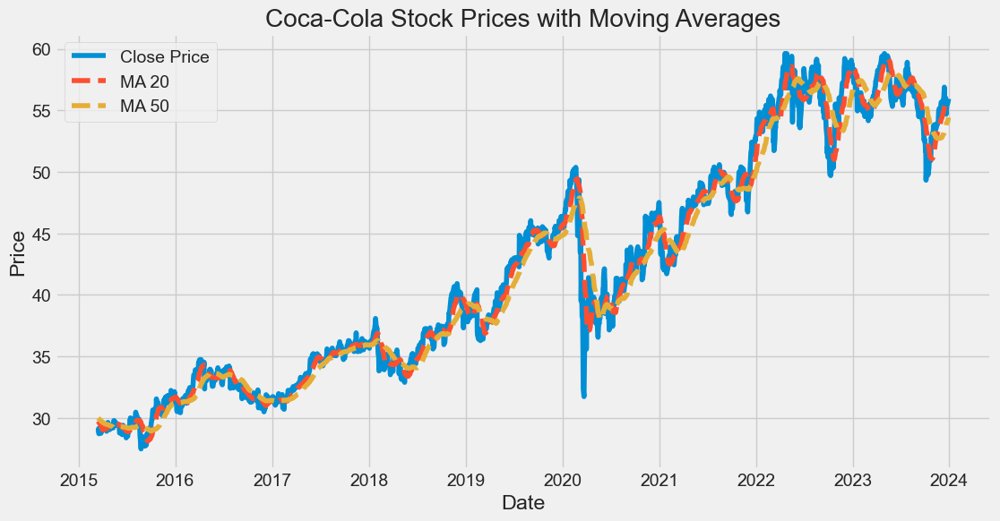

In [63]:
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Close'], label='Close Price')
plt.plot(data['Date'], data['MA_20'], label='MA 20',
linestyle='--')
plt.plot(data['Date'], data['MA_50'], label='MA 50',
linestyle='--')
plt.title('Coca-Cola Stock Prices with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend() 
plt.show()

# Correlation heatmap

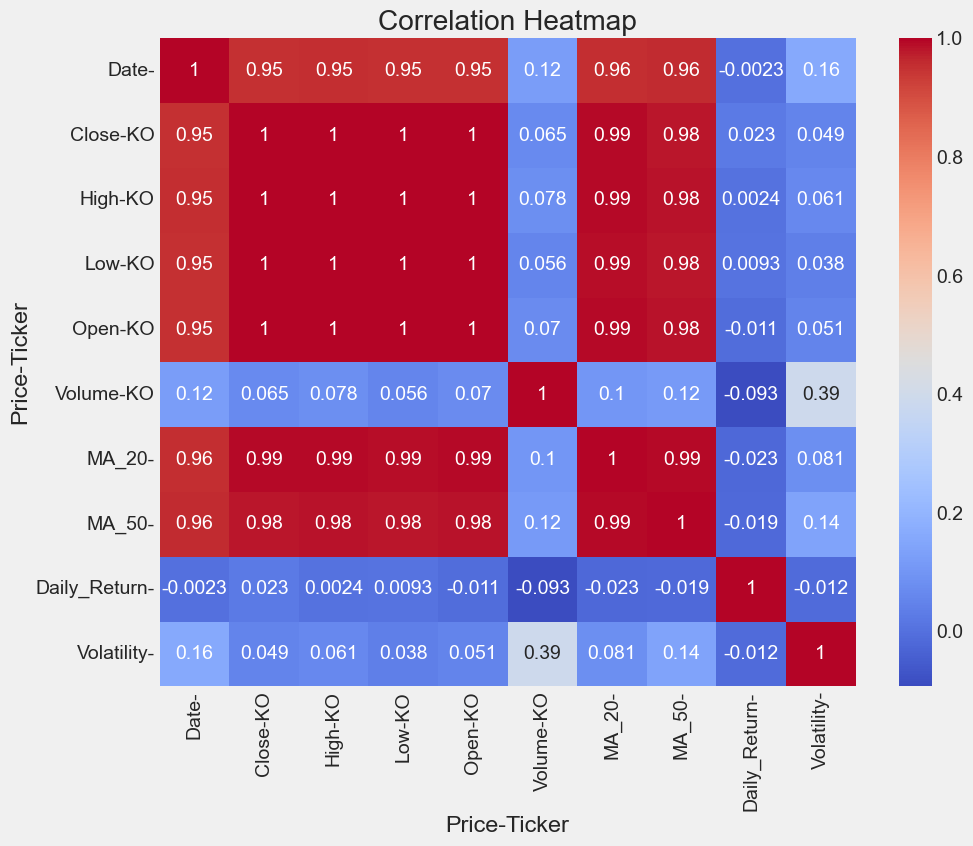

In [64]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap') 
plt.show()

# Model for prediction stock price

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error


In [14]:
data.head(1)

Price,Date,Close,High,Low,Open,Volume,MA_20,MA_50,Daily_Return,Volatility
Ticker,,KO,KO,KO,KO,KO,,,,
49,2015-03-16,28.913841,28.956898,28.698549,28.705724,15238800,29.748196,29.998752,0.009521,0.011377


In [15]:
features = ['Open', 'High', 'Low', 'Volume', 'MA_20', 'MA_50', 'Daily_Return', 'Volatility']
target = 'Close'
X = data[features]
y = data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42, shuffle=False)
model = RandomForestRegressor(n_estimators=100,random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

C:\Users\utkar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\base.py:1365: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


In [16]:
y_pred=pd.DataFrame(y_pred)
y_pred.columns = ['Prediction price']

In [17]:
y_pred


,Prediction price
0,55.503825
1,55.687037
2,55.571693
3,55.610420
4,55.683449
...,...
438,55.246146
439,55.547894
440,55.564973
441,55.666221


In [18]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

Mean Squared Error: 2.589853655759748
Mean Absolute Error: 1.1591771714359052


# Live prediction system

In [19]:
live_data = yf.download(ticker, period='1d', interval='1m')

C:\Users\utkar\AppData\Local\Temp\ipykernel_20976\4146498620.py:1: FutureWarning: YF.download() has changed argument auto_adjust default to True
  live_data = yf.download(ticker, period='1d', interval='1m')
[*********************100%***********************]  1 of 1 completed


In [20]:
live_data['MA_20'] =live_data['Close'].rolling(window=20).mean()
live_data['MA_50'] =live_data['Close'].rolling(window=50).mean()
live_data['Daily_Return'] = live_data['Close'].pct_change()
live_data['Volatility'] =live_data['Daily_Return'].rolling(window=20).std()

In [21]:
live_data.isnull().sum()

Price         Ticker
Close         KO         0
High          KO         0
Low           KO         0
Open          KO         0
Volume        KO         0
MA_20                   19
MA_50                   49
Daily_Return             1
Volatility              20
dtype: int64

In [22]:
live_data.fillna(0, inplace=True)

In [23]:
live_data.isnull().sum()

Price         Ticker
Close         KO        0
High          KO        0
Low           KO        0
Open          KO        0
Volume        KO        0
MA_20                   0
MA_50                   0
Daily_Return            0
Volatility              0
dtype: int64

In [24]:
latest_features = live_data[features].iloc[-1:].dropna()
live_prediction = model.predict(latest_features)

print(f"Predicted Closing Price: {live_prediction[0]}")

Predicted Closing Price: 55.72234142303467


In [25]:
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
from pandas_datareader.data import DataReader
from datetime import datetime
from math import sqrt
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

In [72]:
KO_Data =pd.read_csv('Coca-Cola_stock_history.csv')

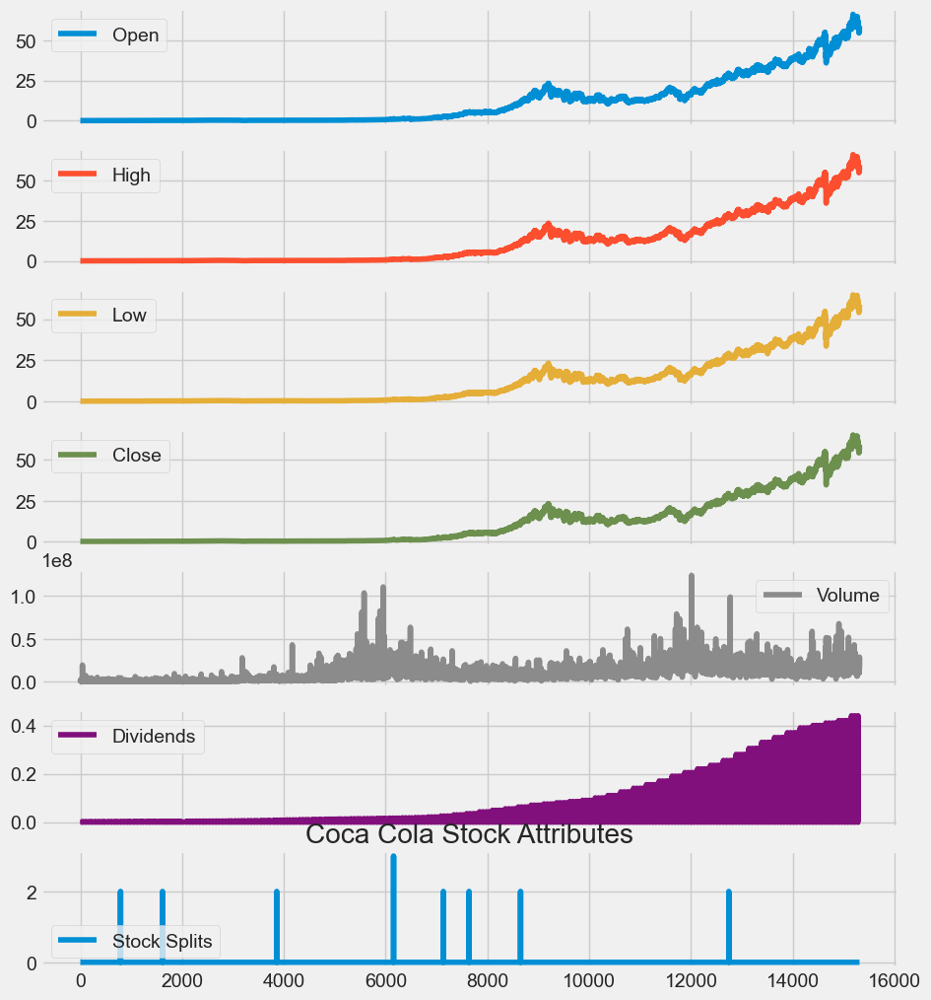

In [73]:
KO_Data.plot(subplots = True, figsize = (10,12))
plt.title('Coca Cola Stock Attributes')
plt.show()

In [76]:
def plot_close_val(data_frame, column, stock):
 plt.figure(figsize=(16,6))
 plt.title(column + ' Price History for ' + stock )
 plt.plot(data_frame[column])
 plt.xlabel('Date', fontsize=18)
 plt.ylabel(column + ' Price USD ($) for ' + stock,fontsize=18) 
 plt.savefig('4.png')    
 


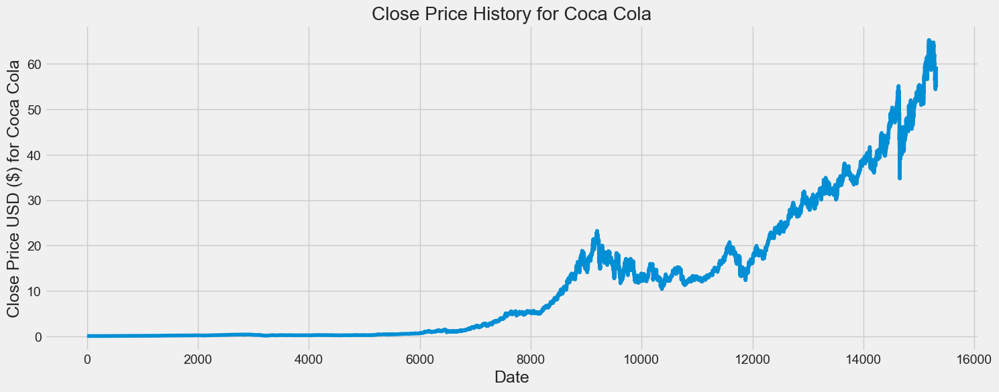

<Figure size 640x480 with 0 Axes>

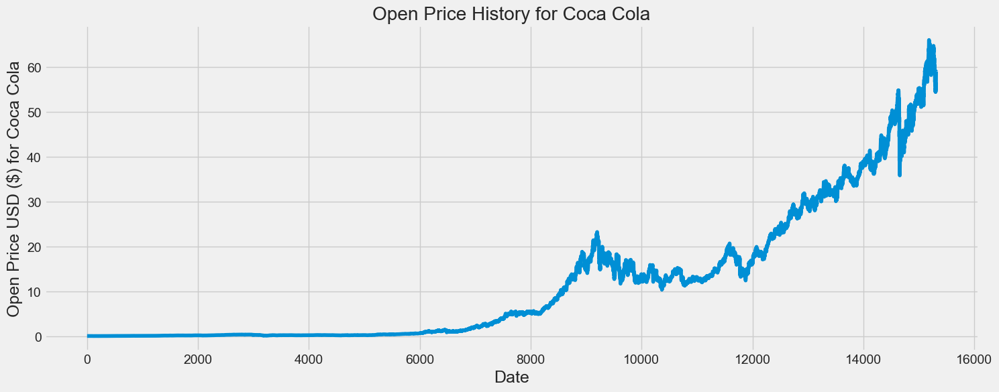

In [84]:
plt.figure(figsize=(10, 6)) # Starts a new, clean figure
plot_close_val(KO_Data, 'Close', 'Coca Cola')
plt.savefig('close_price_5.png') # Saves the 'Close' chart
plt.show() # Displays the 'Close' chart

# 2. Save the 'Open' Chart
# =======================================================
plt.figure(figsize=(10, 6)) # Starts a NEW, clean figure for the 'Open' chart
plot_close_val(KO_Data, 'Open', 'Coca Cola')
plt.savefig('open_price_6.png') # Saves the 'Open' chart
plt.show()

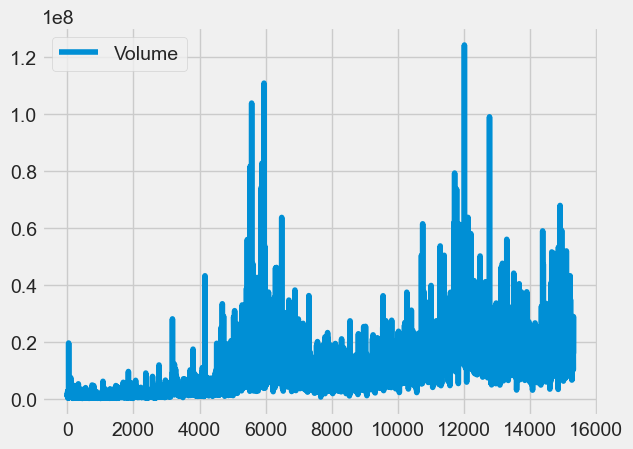

In [50]:

KO_Data[["Volume"]].plot()
plt.savefig('.png') 

In [51]:
ko_info =pd.read_csv('Coca-Cola_stock_info.csv',header=None,names=(['Description','Information']))
ko_info.dropna()
ko_info.drop(ko_info.loc[ko_info['Information']=='nan'].index,inplace=True)
ko = ko_info.sort_values('Information').style

In [52]:
ko

,Description,Information
49,gmtOffSetMilliseconds,-18000000
145,bid,0
138,ask,0
77,heldPercentInsiders,0.00636
68,sharesPercentSharesOut,0.0074
100,shortPercentOfFloat,0.0074
108,trailingAnnualDividendYield,0.027917083
147,dividendYield,0.028099999
29,returnOnAssets,0.07831
75,SandP52WeekChange,0.15025425


In [53]:
adj_close_px = KO_Data['Close']
moving_avg = adj_close_px.rolling(window=40).mean()
moving_avg[-10:]

15301    59.573229
15302    59.329031
15303    59.103823
15304    58.921440
15305    58.725320
15306    58.504966
15307    58.298918
15308    58.171838
15309    58.088689
15310    58.030935
Name: Close, dtype: float64

# Plot the adjusted closing price, the short and long windows ofrolling means

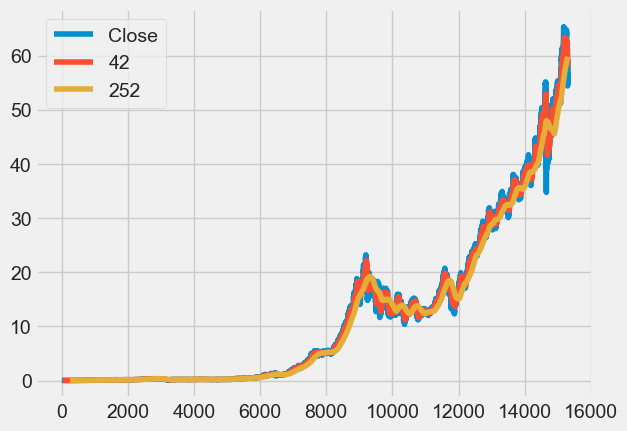

In [54]:
KO_Data['42'] = adj_close_px.rolling(window=40).mean()
KO_Data['252'] = adj_close_px.rolling(window=252).mean()
KO_Data[['Close', '42', '252']].plot()
plt.savefig('7.png') 
plt.show()

# Show the resulting plot

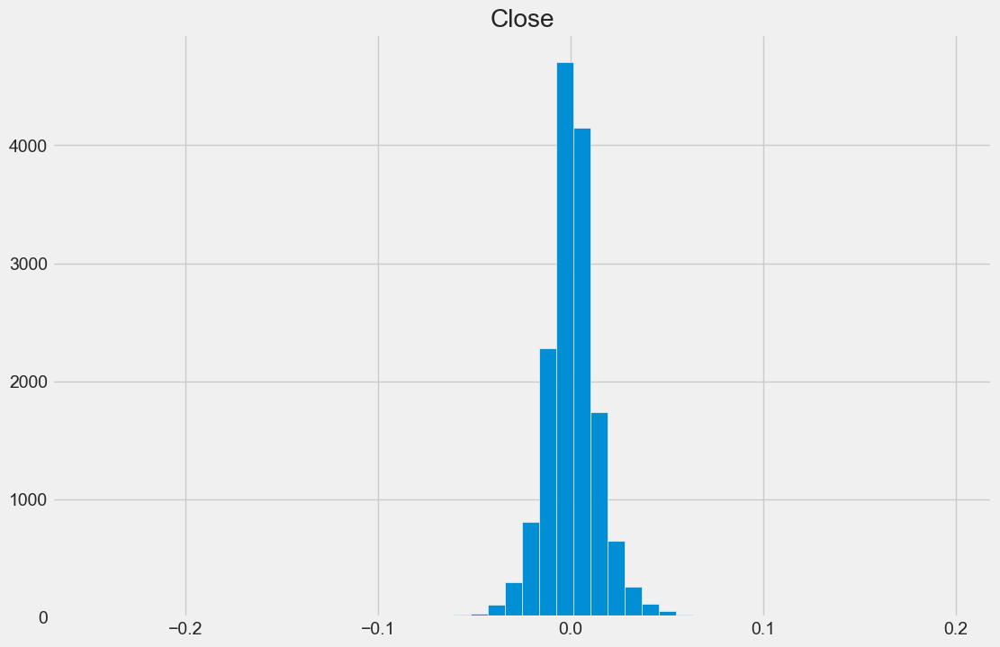

In [55]:
daily_close_px = KO_Data[['Close']]
daily_pct_change = daily_close_px.pct_change()
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))
plt.savefig('8.png') 
plt.show()

In [56]:
min_periods = 75
vol = daily_pct_change.rolling(min_periods).std() *np.sqrt(min_periods)

# Plot the volatility

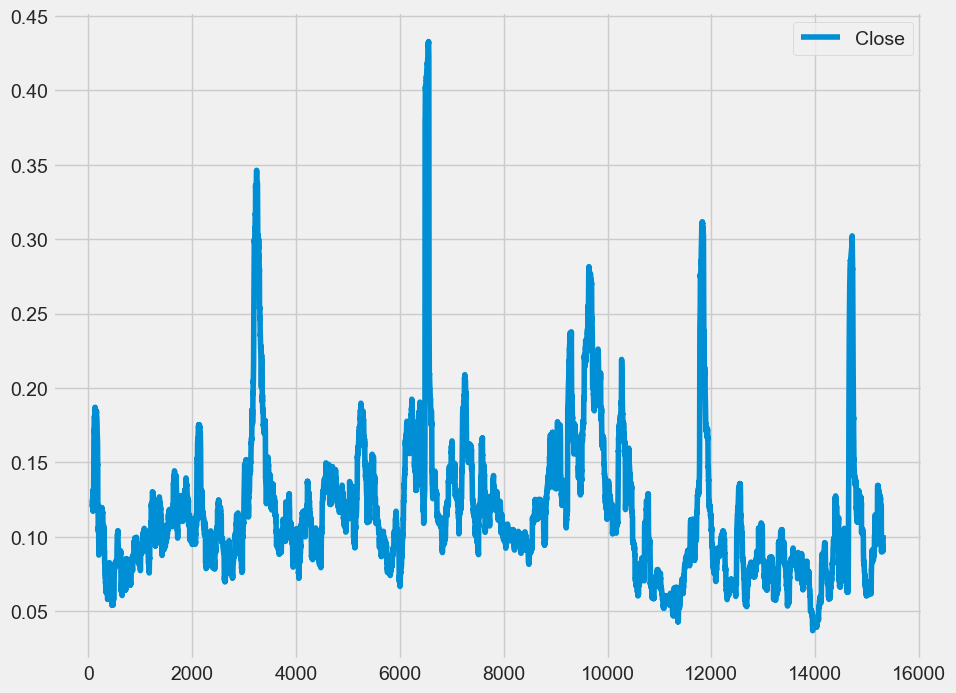

In [57]:
vol.plot(figsize=(10, 8))
plt.savefig('9.png') 
plt.show()

# Plot a scatter matrix with the `daily_pct_change` data

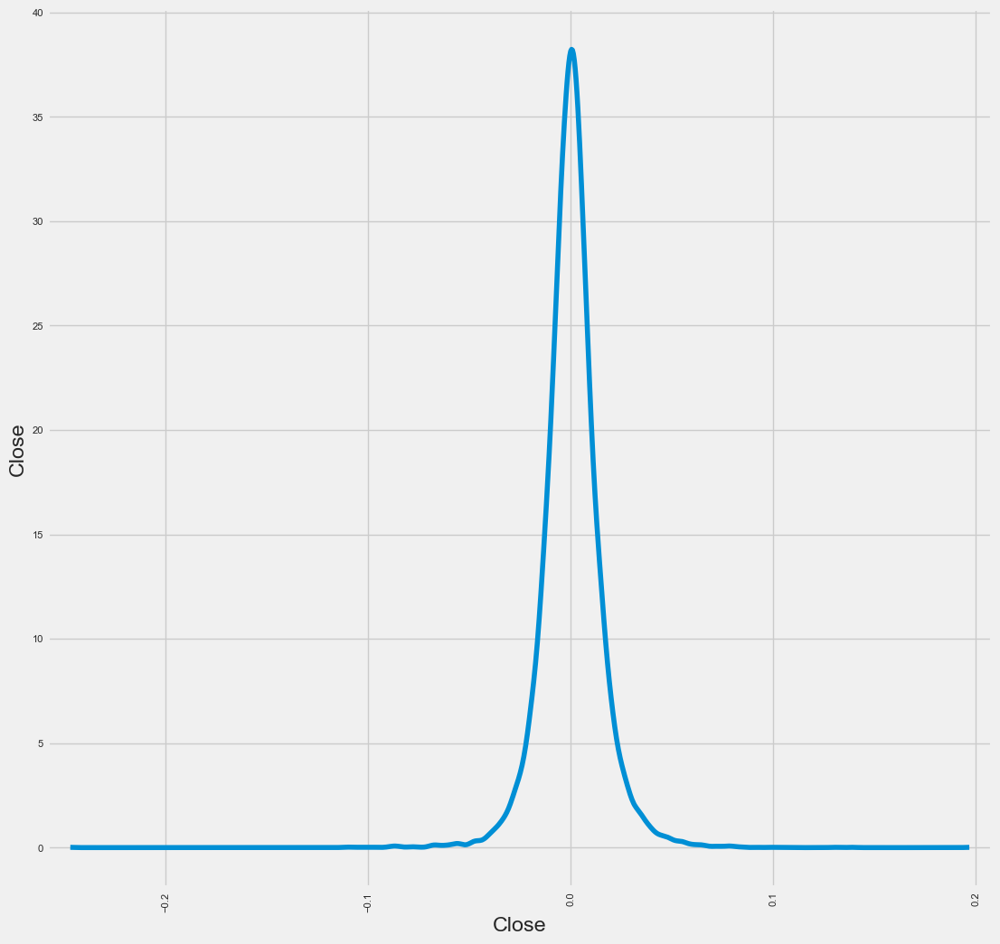

In [58]:
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde',alpha=0.1,figsize=(12,12))
plt.savefig('10.png') 
plt.show()

In [59]:
import plotly.graph_objects as go

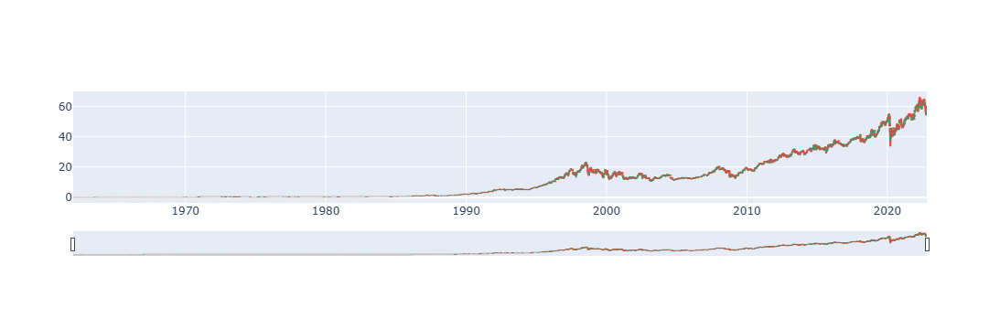

<Figure size 640x480 with 0 Axes>

In [60]:
KO_Data=KO_Data.reset_index()
fig = go.Figure(data=go.Ohlc(x=KO_Data['Date'],open=KO_Data['Open'],high=KO_Data['High'],low=KO_Data['Low'],close=KO_Data['Close']))
plt.savefig('11.png') 
fig.show()

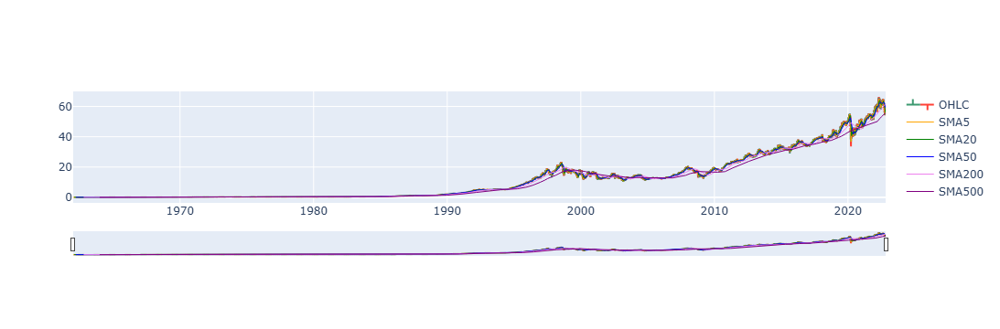

<Figure size 640x480 with 0 Axes>

In [61]:
KO_Data['SMA5'] = KO_Data.Close.rolling(5).mean()
KO_Data['SMA20'] = KO_Data.Close.rolling(20).mean()
KO_Data['SMA50'] = KO_Data.Close.rolling(50).mean()
KO_Data['SMA200'] = KO_Data.Close.rolling(200).mean()
KO_Data['SMA500'] = KO_Data.Close.rolling(500).mean()

fig =go.Figure(data=[go.Ohlc(x=KO_Data['Date'],open=KO_Data['Open'],high=KO_Data['High'],low=KO_Data['Low'],close=KO_Data['Close'],name = "OHLC"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA5, line=dict(color='orange', width=1),name="SMA5"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA20, line=dict(color='green', width=1),name="SMA20"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA50, line=dict(color='blue', width=1),name="SMA50"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA200, line=dict(color='violet', width=1),name="SMA200"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA500, line=dict(color='purple', width=1),name="SMA500")])
plt.savefig('12.png') 
fig.show()

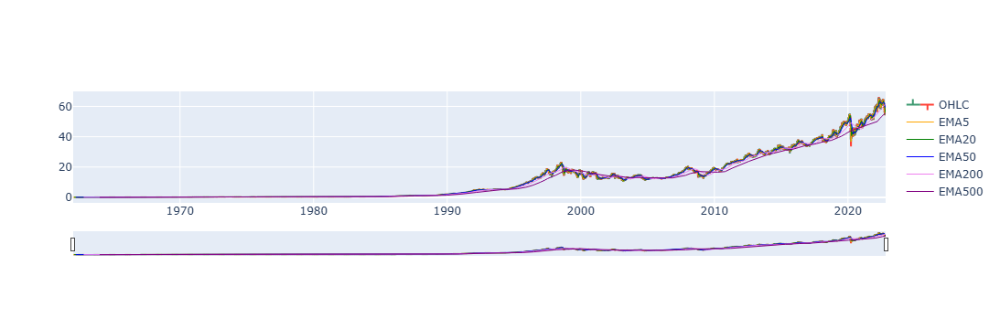

<Figure size 640x480 with 0 Axes>

In [62]:
KO_Data['EMA5'] = KO_Data.Close.ewm(span=5,adjust=False).mean()

KO_Data['EMA20'] = KO_Data.Close.ewm(span=20,adjust=False).mean()
KO_Data['EMA50'] = KO_Data.Close.ewm(span=50,adjust=False).mean()
KO_Data['EMA200'] = KO_Data.Close.ewm(span=200,adjust=False).mean()
KO_Data['EMA500'] = KO_Data.Close.ewm(span=500,adjust=False).mean()

fig = go.Figure(data=[go.Ohlc(x=KO_Data['Date'],open=KO_Data['Open'],high=KO_Data['High'],low=KO_Data['Low'],close=KO_Data['Close'], name ="OHLC"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA5, line=dict(color='orange', width=1),name="EMA5"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA20, line=dict(color='green', width=1),name="EMA20"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA50, line=dict(color='blue', width=1),name="EMA50"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA200, line=dict(color='violet', width=1),name="EMA200"),go.Scatter(x=KO_Data.Date,y=KO_Data.SMA500, line=dict(color='purple', width=1),name="EMA500")])
plt.savefig('13.png') 
fig.show()